Running SOM for time series data for patterns.

In [1]:
#loading libraries
library(here)
library(dplyr)
library(tidyr)
library(diann)
library(readr)
library(pheatmap)
library(openxlsx)
library(rstatix)
library("FactoMineR")
library(factoextra)
library(kohonen)

# to disable svg, but png for correct inclusion of figures on html output
options(jupyter.plot_mimetypes = c("text/plain", "image/png" ))
data.dir<-"Proj2024Jan"
output.dir<-"Proj2024Jan"

source(here("functions.R"))# note for jupyter notebook, we need to do something different
    # because we can not start everything from the root of the project, but inside
    # subfolder (so when we do getwd, we will be get the subfolder). "here" can take
    # care of this nicely (because of the .Rprofile in the folder), so we need to 
    # use here wherever we can!!!

here() starts at /home/feng/ms_analysis


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘rstatix’


The following object is masked from ‘package:stats’:

    filter


Loading required package: ggplot2

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ tibble  3.1.8     ✔ stringr 1.5.0
✔ purrr   1.0.1     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ rstatix::filter() masks dplyr::filter(), stats::filter()
✖ dplyr::lag()      masks stats::lag()
✖ purrr::map()      masks kohonen::map()


In [2]:
#showing the locations and how here does!!
getwd()
here()

[1] "/home/feng/ms_analysis/Proj2024Jan"

[1] "/home/feng/ms_analysis"

In [3]:
#Start loading data
#x<-here(output.dir,"Trend.vista_vs_ctrl.RDS")
vista_ctrl<-readRDS(file=here(output.dir,"Trend.vista_vs_ctrl.RDS"))
vistaSNS101_ctrl<-readRDS(file=here(output.dir,"Trend.vistaSns101_vs_ctrl.RDS"))
vistaSNS101_vista<-readRDS(file=here(output.dir,"Trend.vista_vs_vistaSNS101.RDS"))

head(vista_ctrl)

cat("the data table dimension:",dim(vista_ctrl),"\n")


Protein.Group,Genes,0,0.5,2,6,12,24
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A0A075B6H7;A0A0C4DH55;P01624,IGKV3-7;IGKV3D-7;IGKV3-15,9.382712e-07,2.17723841,0.2606044,0.05463944,-0.60650344,0.22281650
A0A075B6S5,IGKV1-27,9.059787e-07,6.82645273,0.4343705,-0.41844103,-8.83722481,0.52485091
A0A087WSZ0,IGKV1D-8,-1.732203e-06,2.38891852,0.4788028,0.32075701,-8.87002367,0.43760674
A0A0B4J1V1;P01762;P01763;P01780,IGHV3-21;IGHV3-11;IGHV3-48;IGHV3-7,2.158160e-07,0.00000000,0.0000000,0.00000000,0.00000000,0.00000000
A0A0B4J275,TRAV17,5.653092e-07,0.00000000,4.6094936,-7.93157321,-3.82648203,-4.11770969
A0A0B4J279,TRAV21,2.121867e-07,-0.06084316,4.4152203,4.33050827,0.01562546,-0.08657776


the data table dimension: 6828 8 


## First try on Vista vs. Ctrl compariso

In [5]:
#vista_ctrl.scaled<-
#    scale(vista_ctrl[,c("0.5","2","6","12","24")])
#vista_ctrl.scaled<-bind_cols(vista_ctrl[,c(1:3)],vista_ctrl.scaled)
#head(vista_ctrl)

#now let's do PCA first.
vista_ctrl.matrix<-(vista_ctrl[,-c(1:2)])
set.seed(50)
xnb<-fviz_nbclust(vista_ctrl.matrix, kmeans, method="wss", k.max=35)

Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”


It seems the possible "elbow" is at 6, 17 or 32.

png 
  2

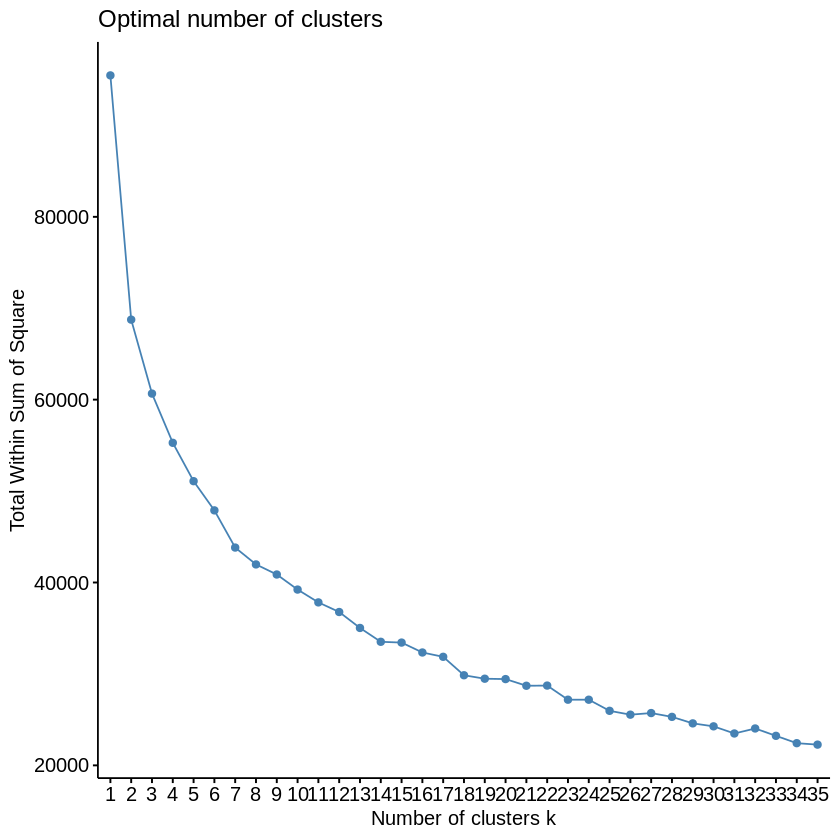

In [8]:
xnb
pdf(file="elbow_nbcluster_vista_vs_ctrl.pdf", height=4.5, width=6)
print(xnb)
dev.off()


In [5]:
#start doing som 
grid<- ceiling(dim(vista_ctrl.matrix)[1] ^ (1/2.5))
grid.2<- 5* sqrt(dim(vista_ctrl.matrix)[1])

cat("grid size 1:", grid, "; grid size 2:",grid.2,"\n")

#doing some
set.seed(50)
som.grid <- somgrid(xdim = grid-5, ydim = grid-5, topo = 'hexagonal', toroidal = T)
som.model <- som(data.matrix(vista_ctrl.matrix), grid = som.grid, rlen=6500)
#summary(tsne.vista_ctrl)

grid size 1: 35 ; grid size 2: 413.1586 


SOM of size 30x30 with a hexagonaltoroidal topology and a bubble neighbourhood function.
The number of data layers is 1.
Distance measure(s) used: sumofsquares.
Training data included: 6828 objects.
Mean distance to the closest unit in the map: 0.557.


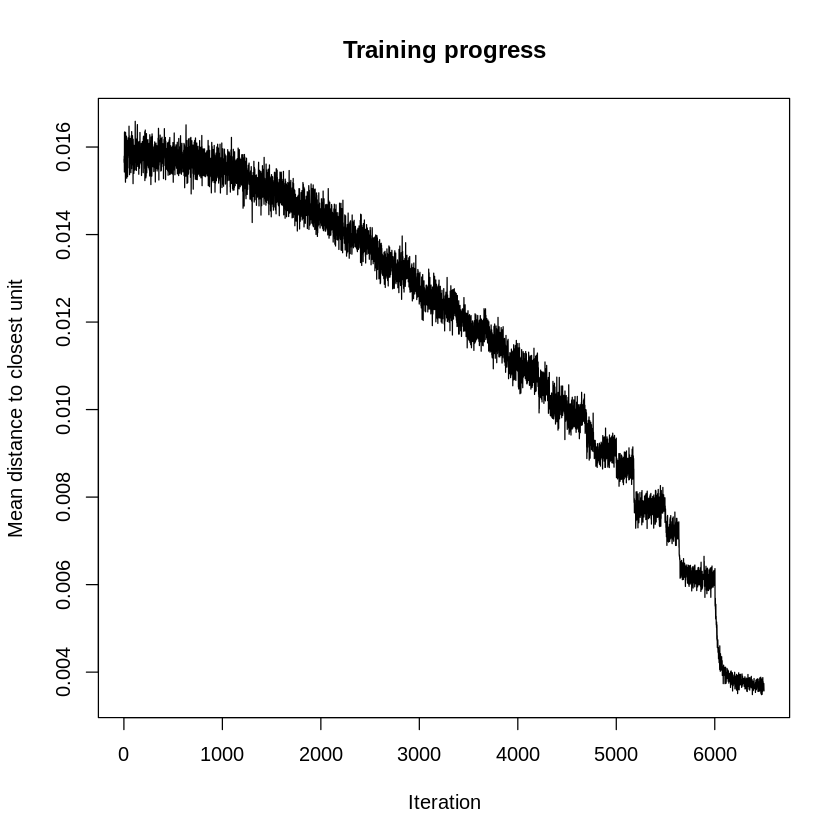

In [6]:

summary(som.model)
#plot(tsne.vista_ctrl$Y)
plot(som.model, type = "changes")

It takes quite long to converge (?). Now we will look at the counts of the mapping

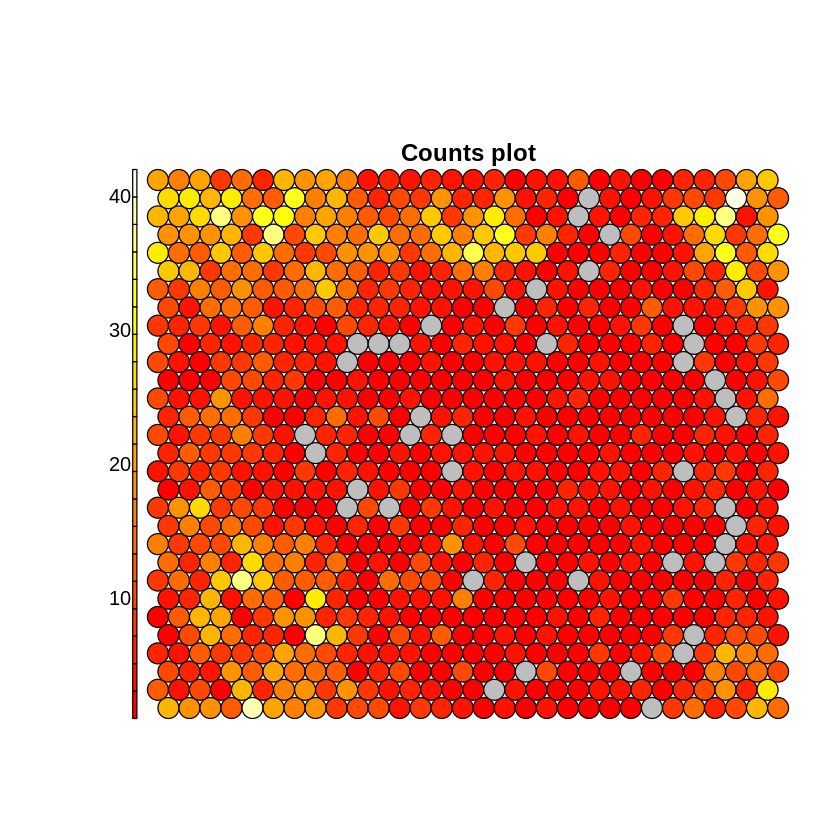

In [7]:
plot(som.model, type = "counts")

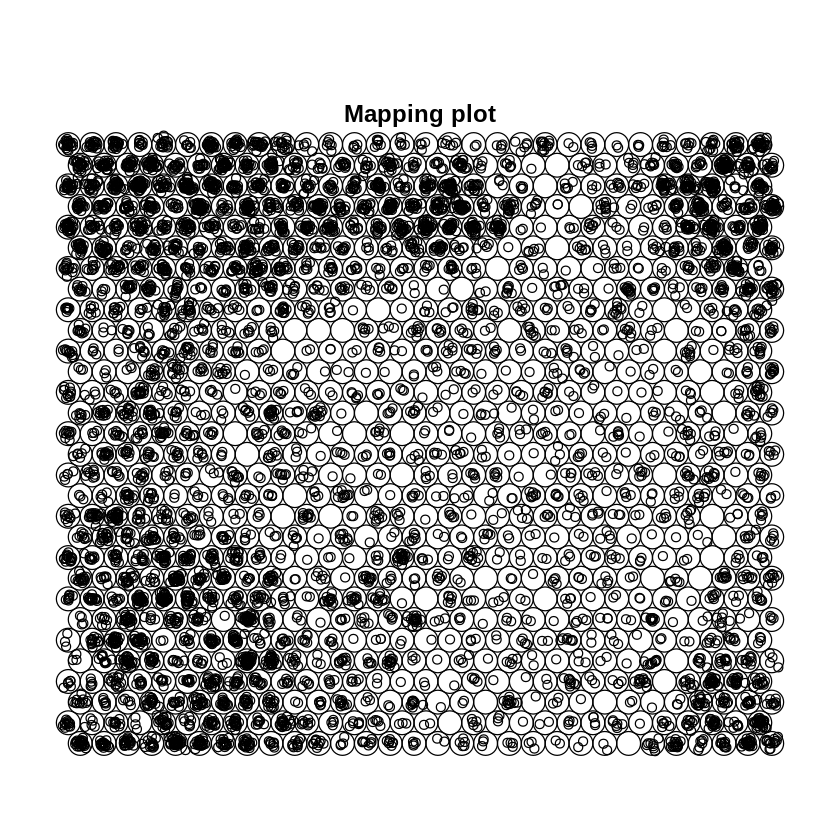

In [8]:
plot(som.model, type = "mapping")

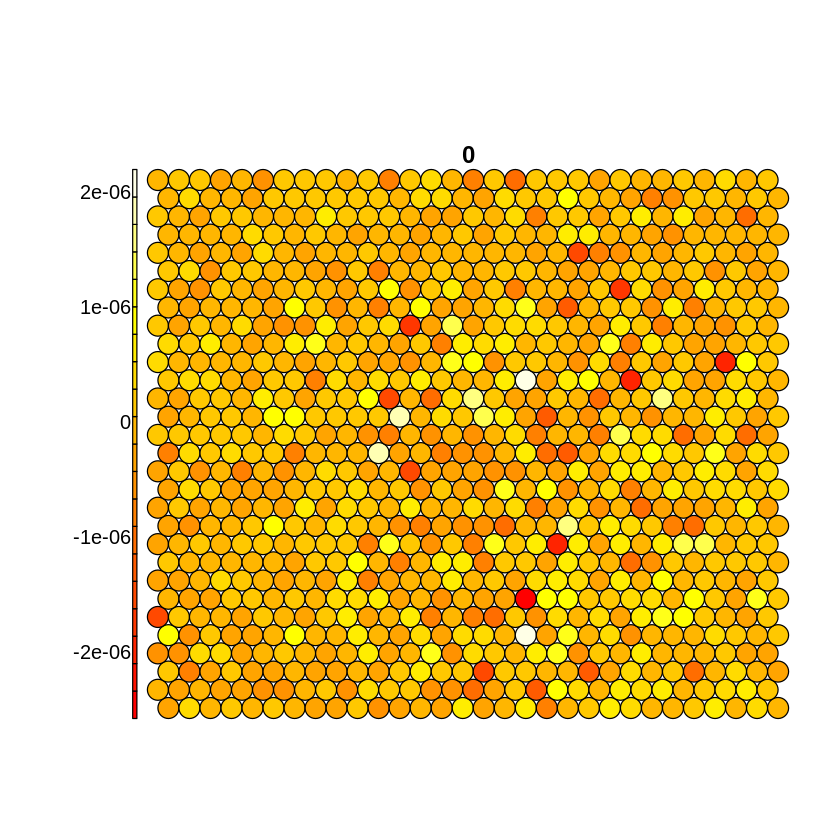

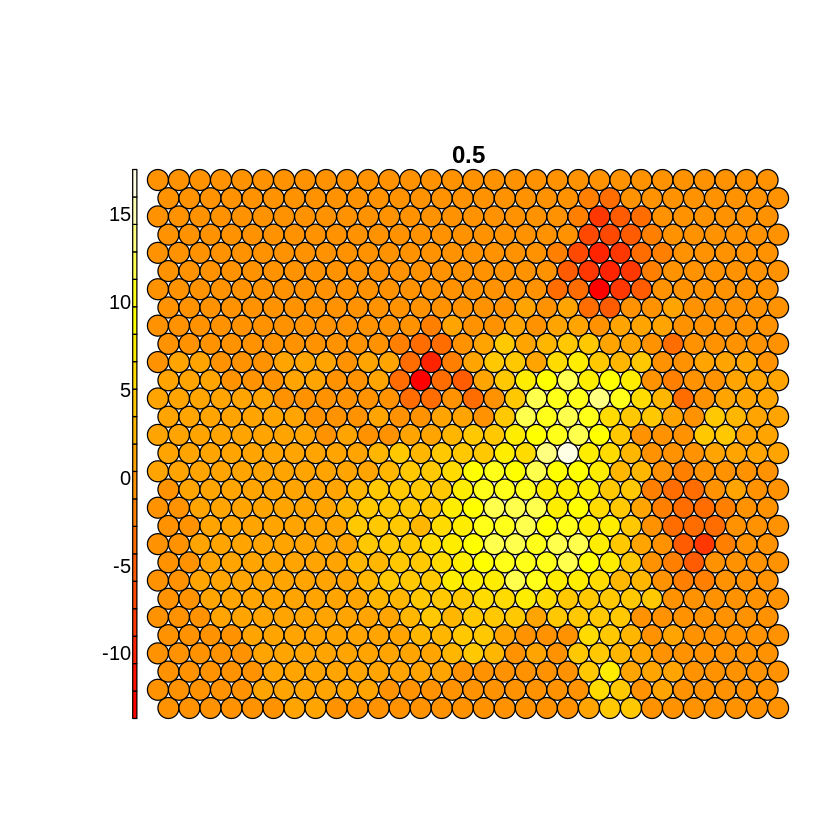

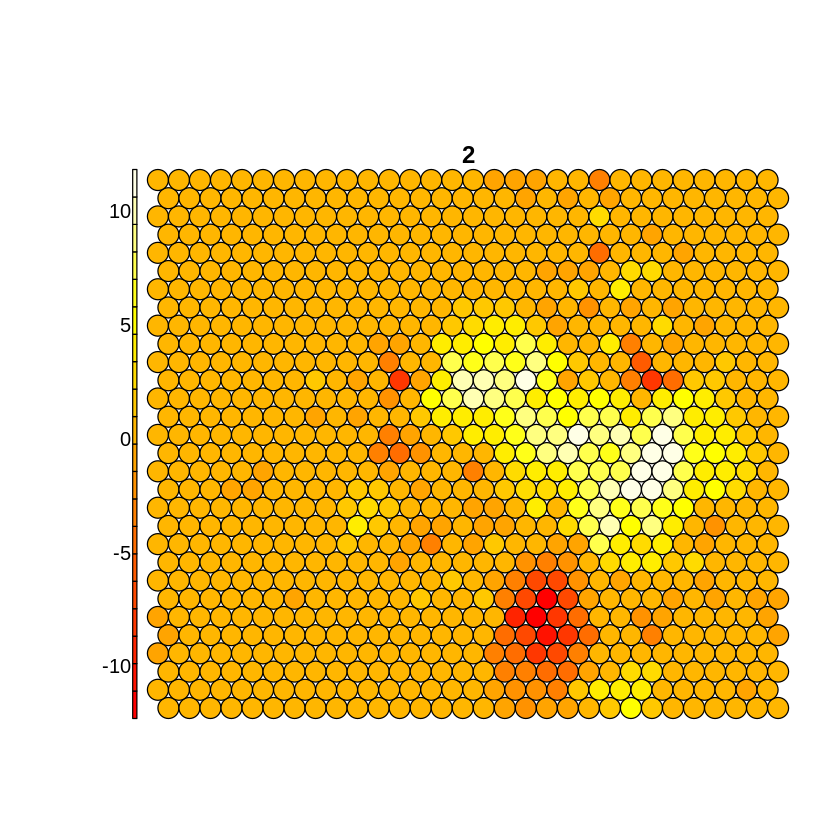

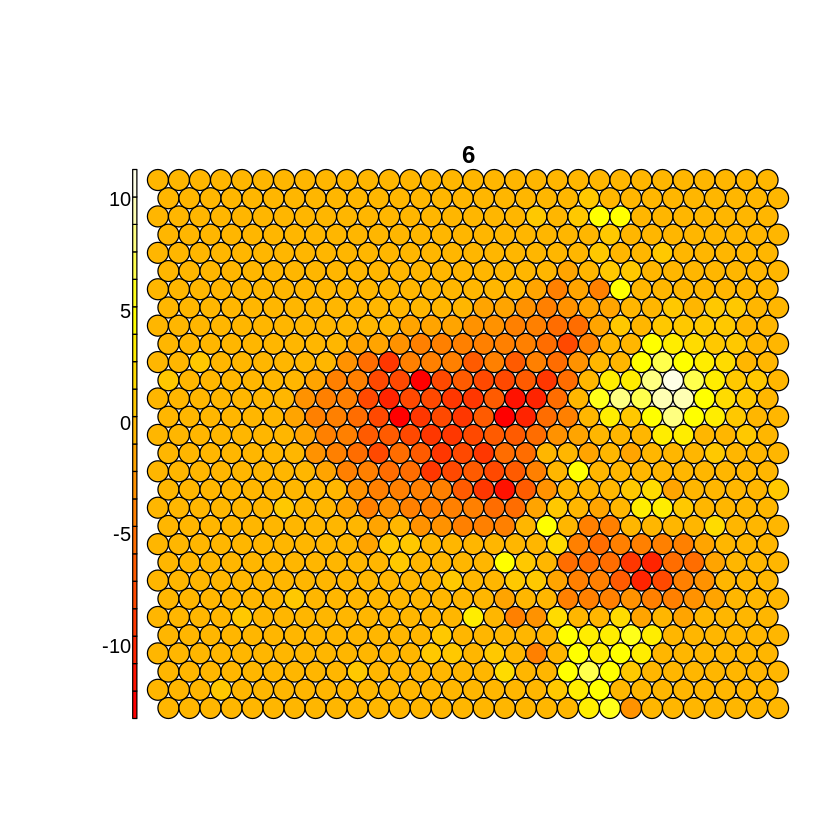

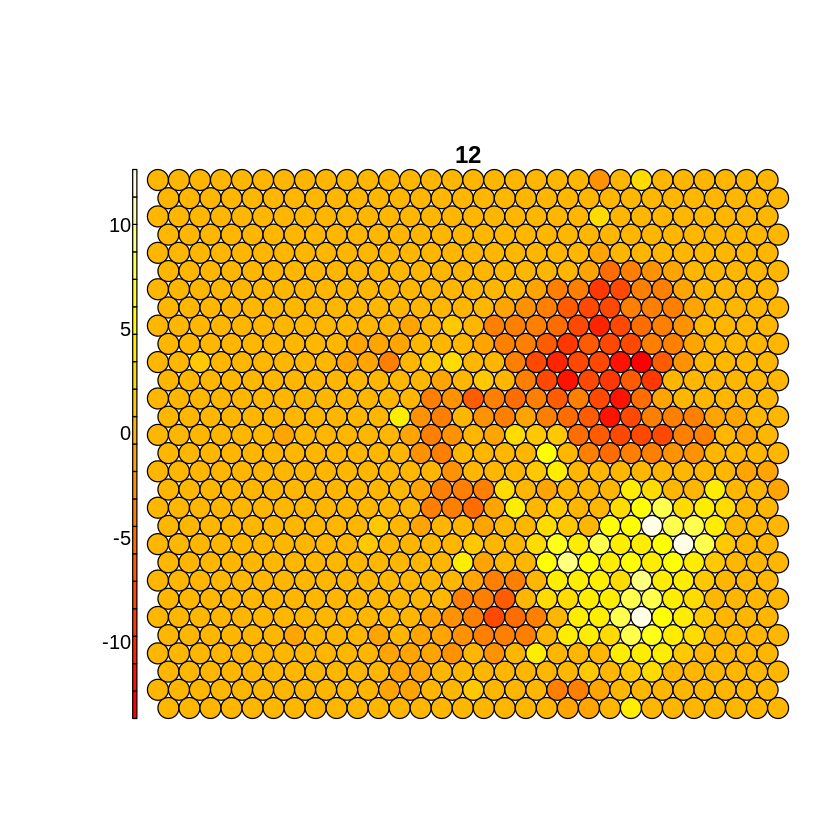

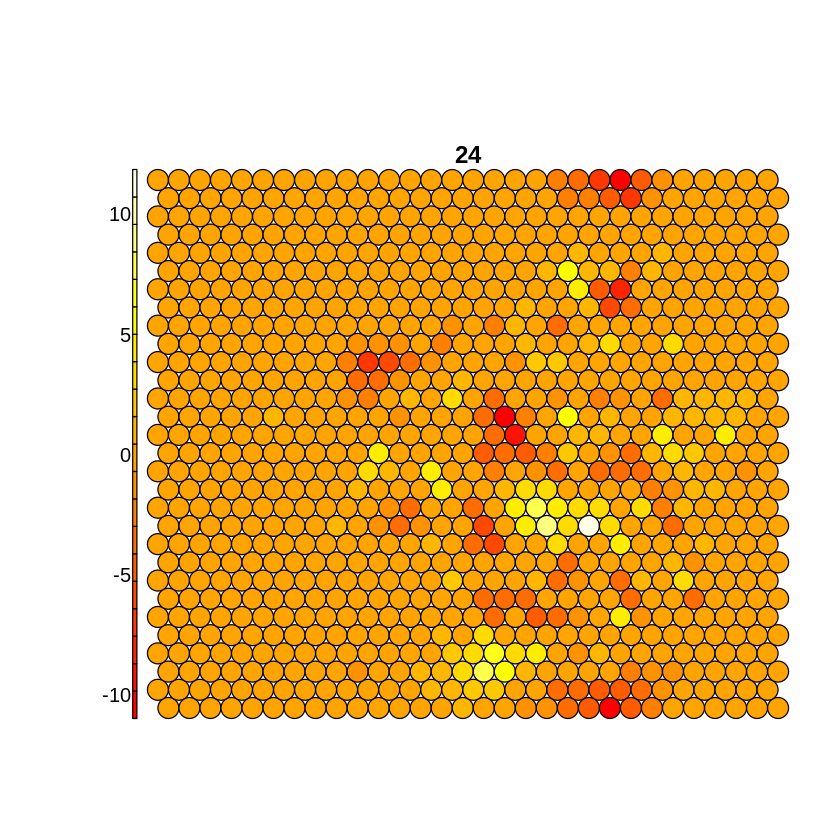

In [9]:
heatmap.som <- function(model){
  for (i in 1:6) {
   plot(model, type = "property", property = getCodes(model)[,i], 
        main = colnames(getCodes(model))[i]) 
  }
}
heatmap.som(som.model)

             Length Class  Mode   
cluster      900    -none- numeric
centers      108    -none- numeric
totss          1    -none- numeric
withinss      18    -none- numeric
tot.withinss   1    -none- numeric
betweenss      1    -none- numeric
size          18    -none- numeric
iter           1    -none- numeric
ifault         1    -none- numeric

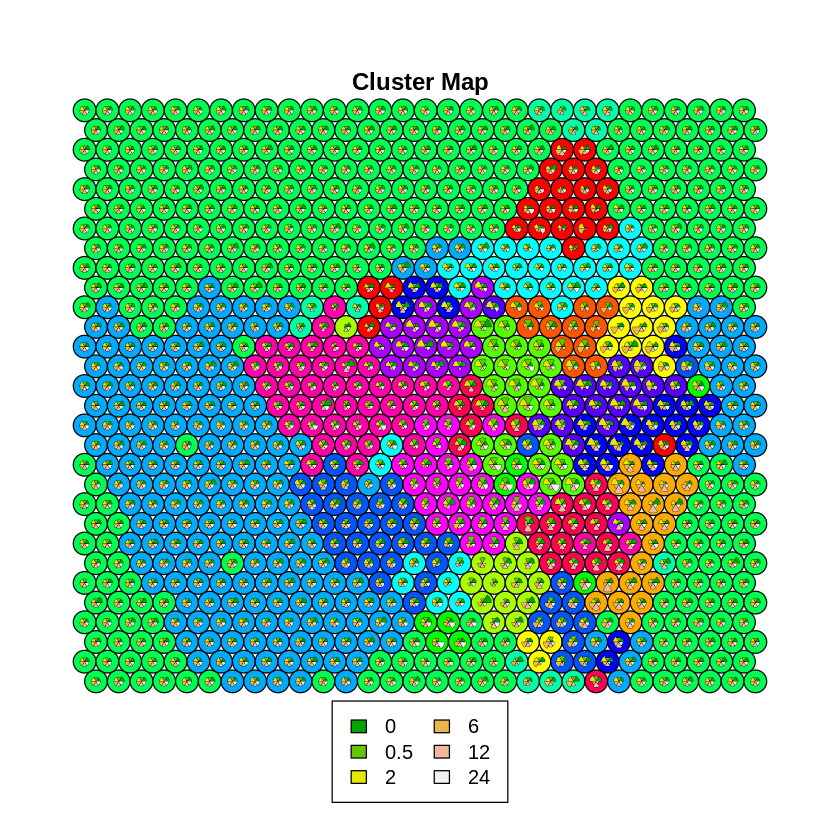

In [10]:
#clustering
set.seed(100)
clust <- kmeans(som.model$codes[[1]], 18)
summary(clust)
plot(som.model, type = "codes", bgcol = rainbow(18)[clust$cluster], main = "Cluster Map")
#add.cluster.boundaries(som.model, clust$cluster)

## Second, we compare Vista SNS101 vs. control.

In [10]:
vistaSNS101_ctrl.matrix<-vistaSNS101_ctrl[,-c(1:2)]
set.seed(50)
xnb2<-fviz_nbclust(vistaSNS101_ctrl.matrix, kmeans, method="wss", k.max=35)

#summary(tsne.vistaSNS101_ctrl)

Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 341400)”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”


It is cluster 7, or 18 and 29?

png 
  2

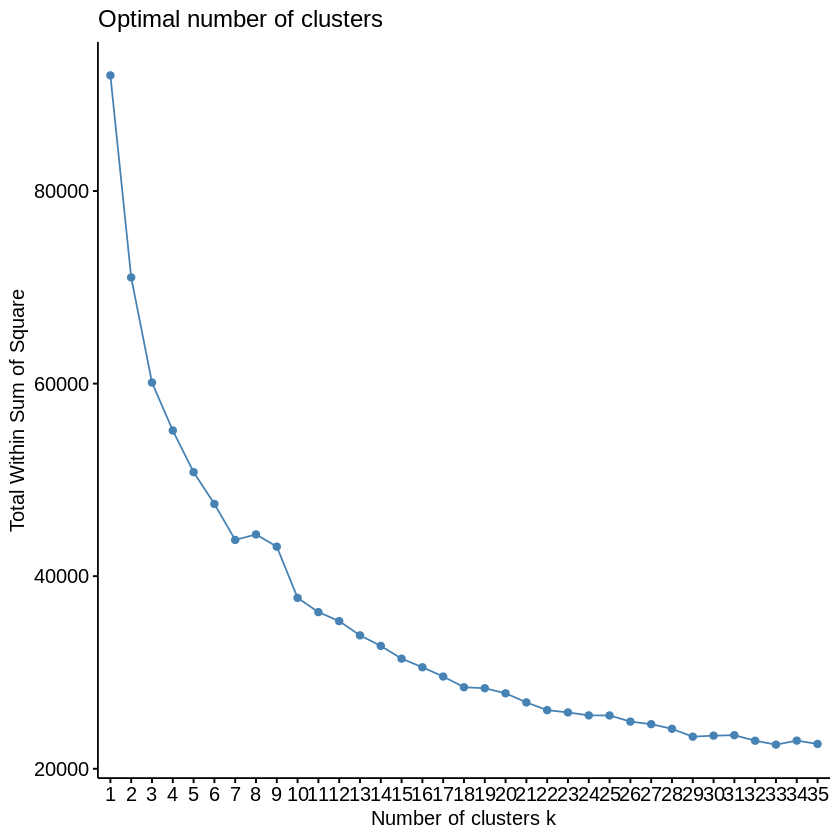

In [11]:
xnb2
pdf(file="elbow_nbcluster_vistaSNS101_vs_ctrl.pdf", height=4.5, width=6)
print(xnb2)
dev.off()

In [12]:
#start doing som 
grid<- ceiling(dim(vistaSNS101_ctrl.matrix)[1] ^ (1/2.5))
grid.2<- 5* sqrt(dim(vistaSNS101_ctrl.matrix)[1])

cat("grid size 1:", grid, "; grid size 2:",grid.2,"\n")



grid size 1: 35 ; grid size 2: 413.1586 


In [13]:
#doing some
set.seed(50)
som.grid <- somgrid(xdim = grid-5, ydim = grid-5, topo = 'hexagonal', toroidal = T)
som.model_SNS101 <- som(data.matrix(vistaSNS101_ctrl.matrix), grid = som.grid, rlen=6500)
summary(som.model_SNS101)
#plot(tsne.vistaSNS101_ctrl$Y)

SOM of size 30x30 with a hexagonaltoroidal topology and a bubble neighbourhood function.
The number of data layers is 1.
Distance measure(s) used: sumofsquares.
Training data included: 6828 objects.
Mean distance to the closest unit in the map: 0.482.


SOM of size 30x30 with a hexagonaltoroidal topology and a bubble neighbourhood function.
The number of data layers is 1.
Distance measure(s) used: sumofsquares.
Training data included: 6828 objects.
Mean distance to the closest unit in the map: 0.482.


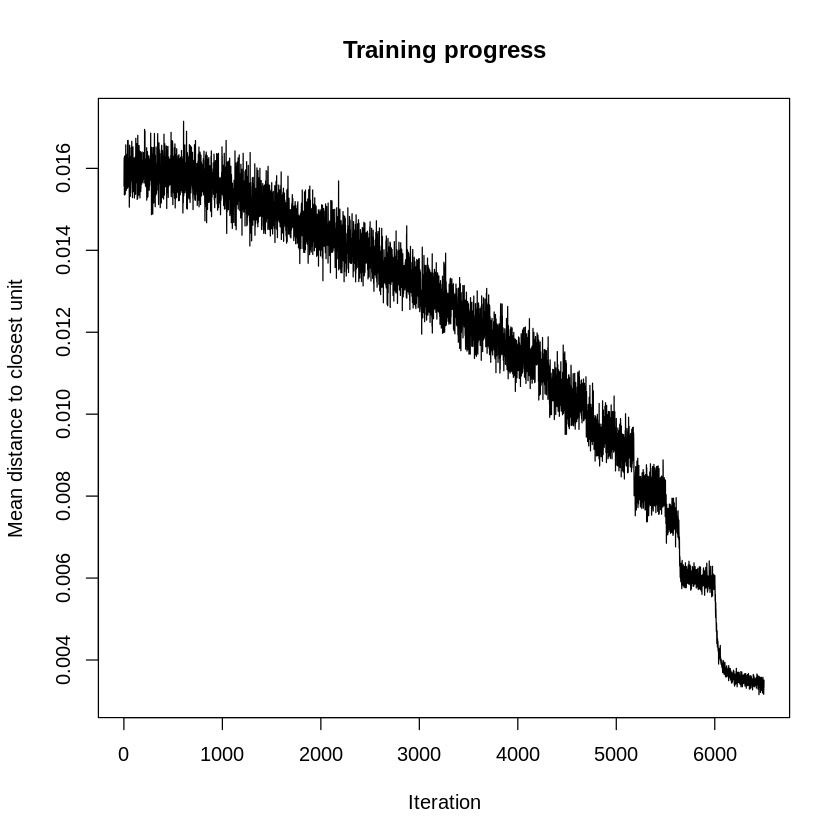

In [14]:
summary(som.model_SNS101)
#plot(tsne.vista_ctrl$Y)
plot(som.model_SNS101, type = "changes")

Similarly, it takes quite long to converge


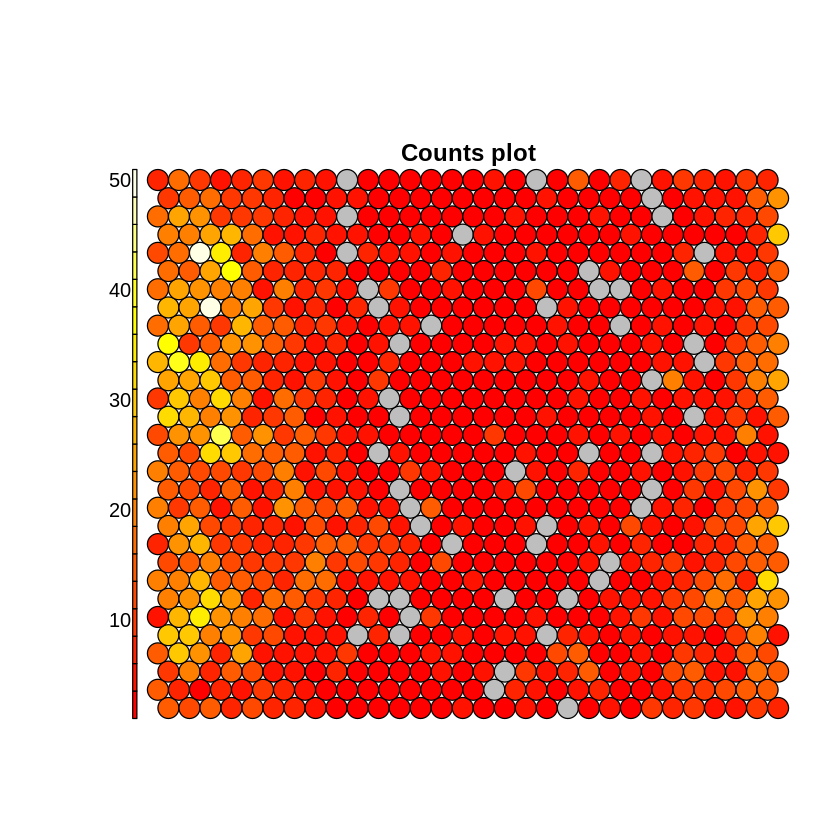

In [15]:
plot(som.model_SNS101, type = "counts")

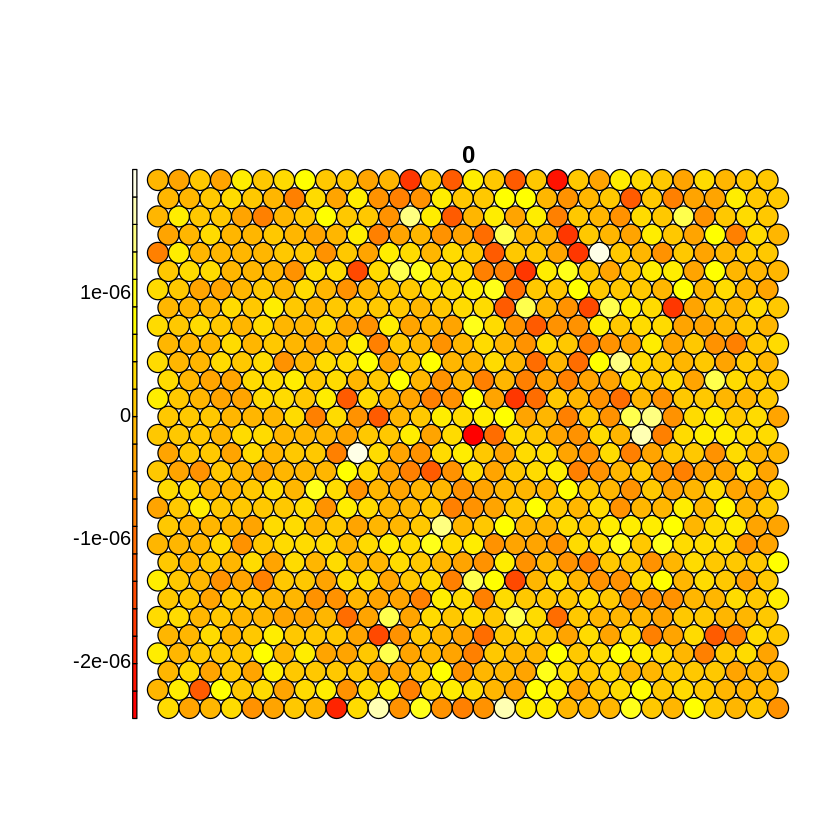

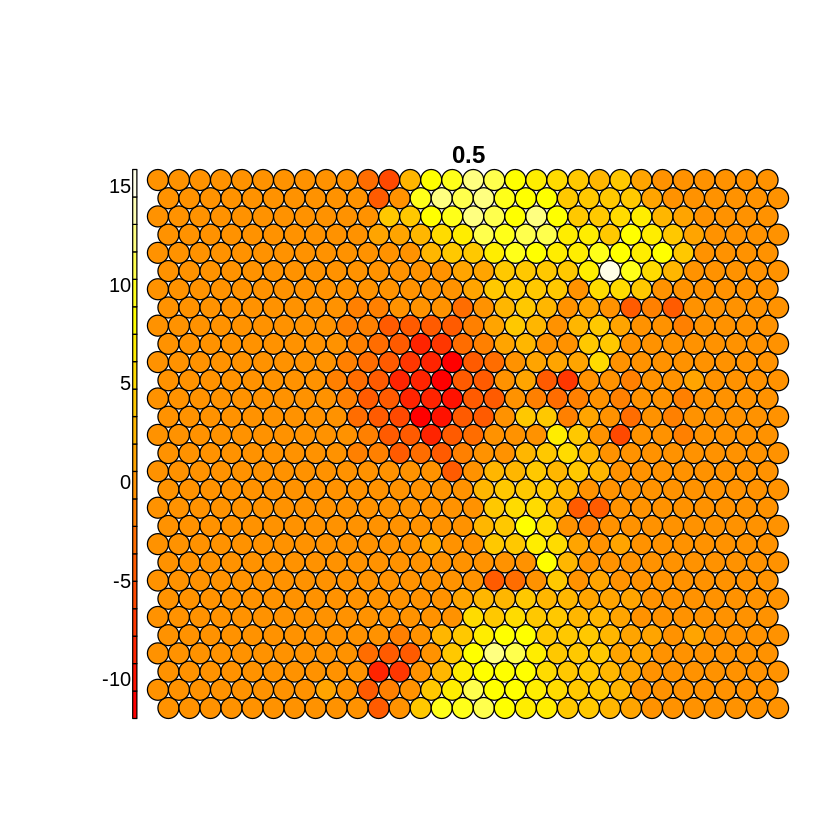

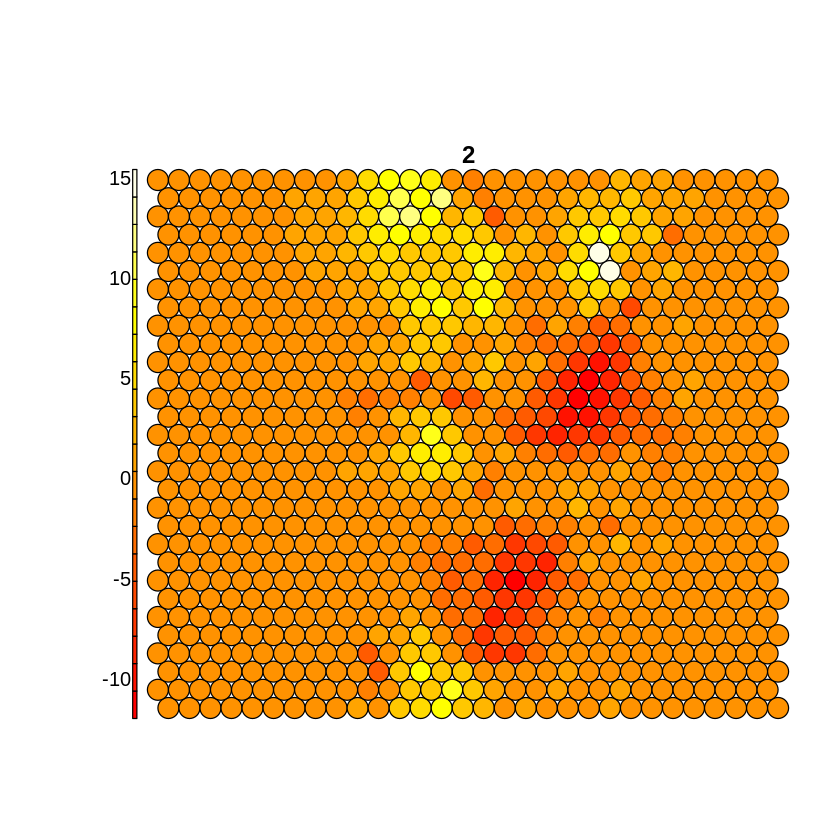

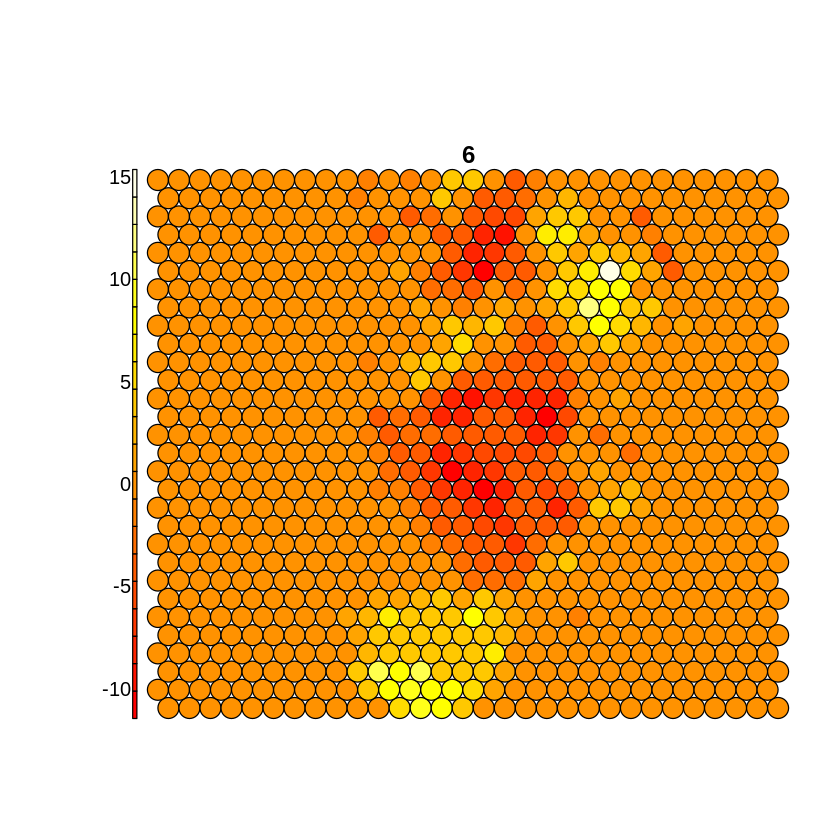

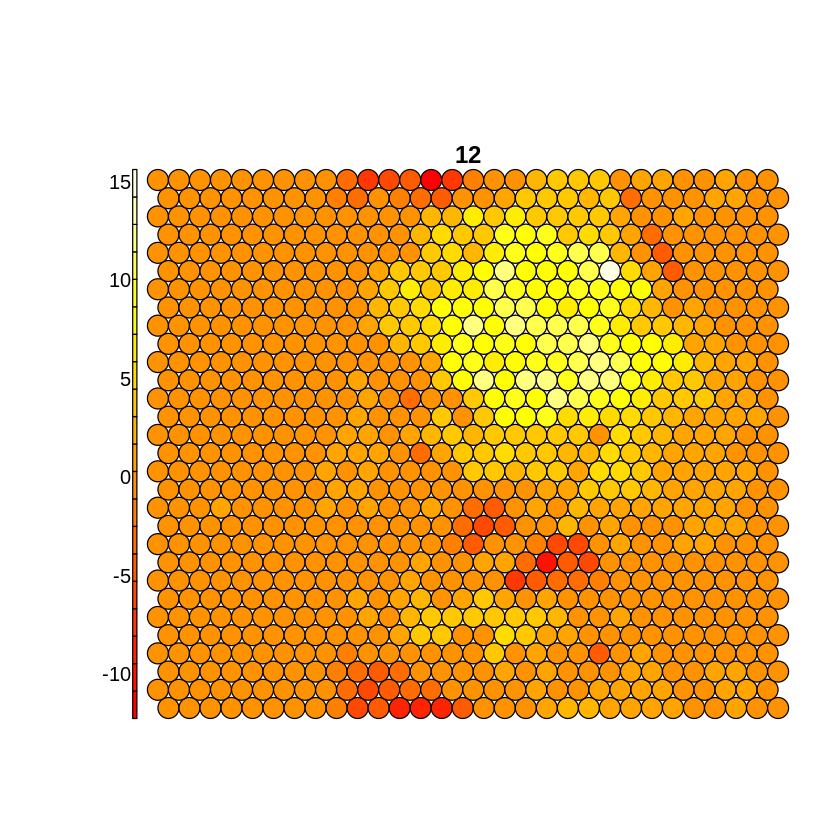

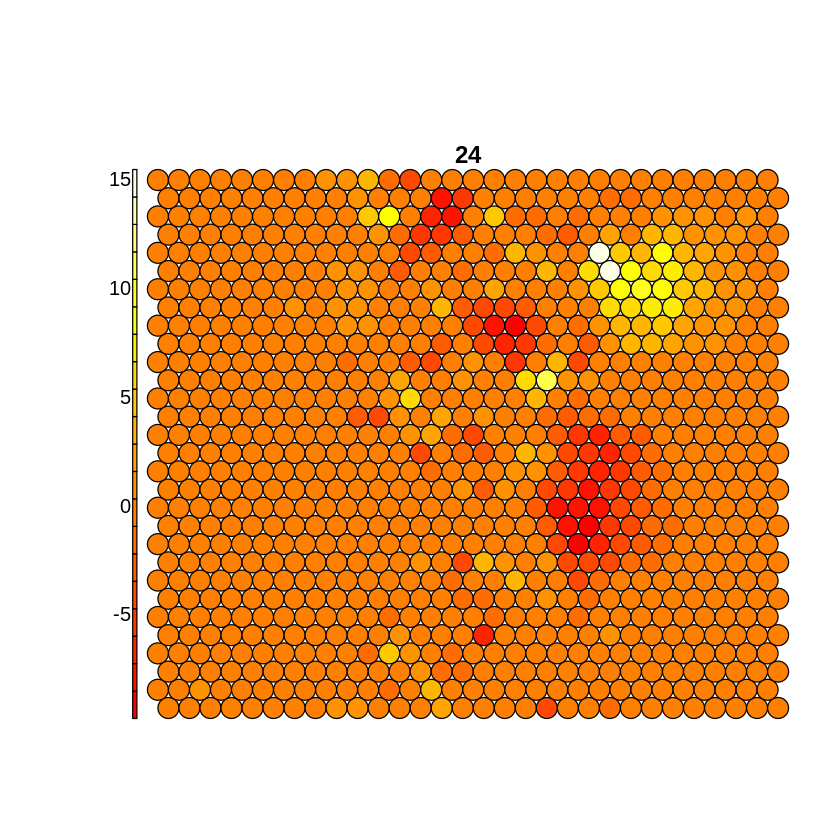

In [16]:
heatmap.som(som.model_SNS101)

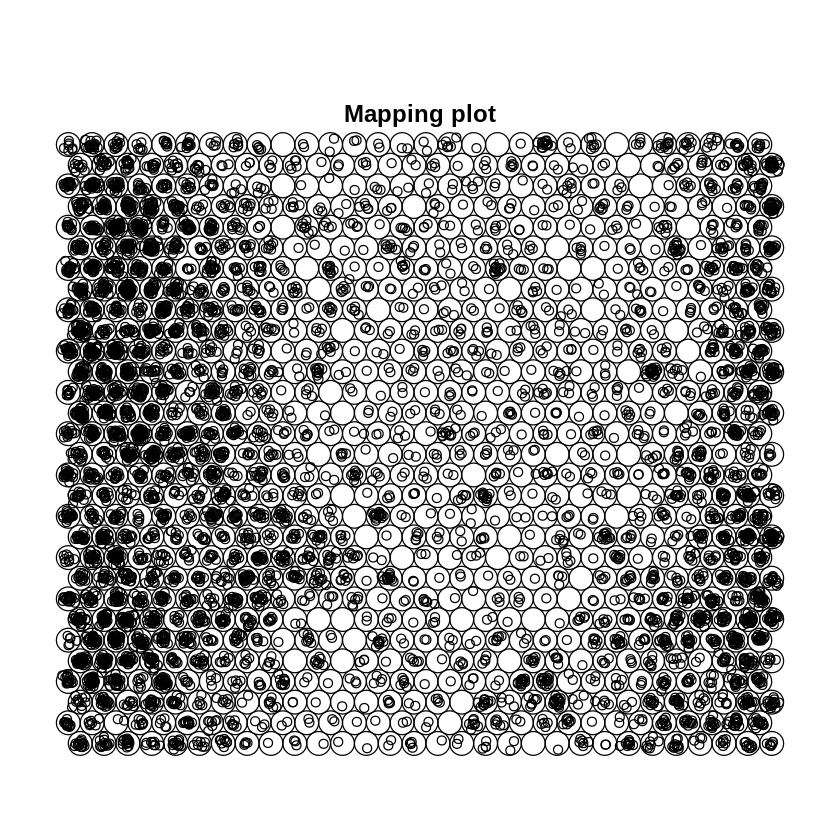

In [17]:
plot(som.model_SNS101, type = "mapping")

             Length Class  Mode   
cluster      900    -none- numeric
centers      102    -none- numeric
totss          1    -none- numeric
withinss      17    -none- numeric
tot.withinss   1    -none- numeric
betweenss      1    -none- numeric
size          17    -none- numeric
iter           1    -none- numeric
ifault         1    -none- numeric

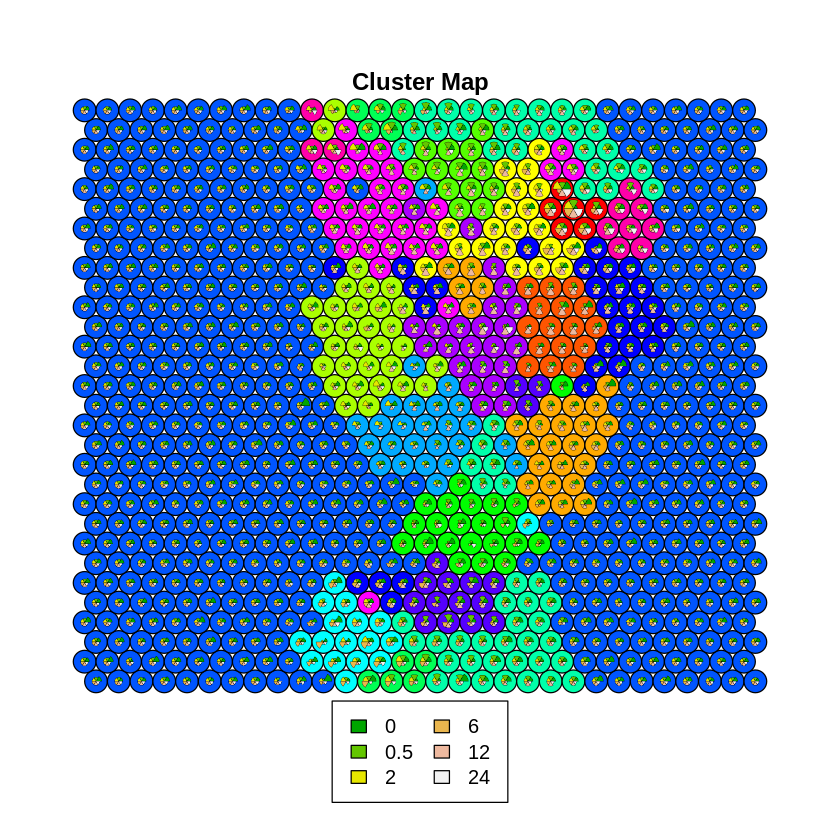

In [18]:
#clustering
set.seed(100)
clust <- kmeans(som.model_SNS101$codes[[1]], 17)
summary(clust)
plot(som.model_SNS101, type = "codes", bgcol = rainbow(18)[clust$cluster], main = "Cluster Map")
#add.cluster.boundaries(som.model, clust$cluster)

## Lastly, we do the difference between SNS101 vista vs Vista

In [12]:
vistaSNS101_vista.matrix<-vistaSNS101_vista[,-c(1:2)]
set.seed(50)
xnb3<-fviz_nbclust(vistaSNS101_vista.matrix, kmeans, method="wss", k.max=35)

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 341400)”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 341400)”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”


similar to above, 7 clusters (or 16 or 32)

png 
  2

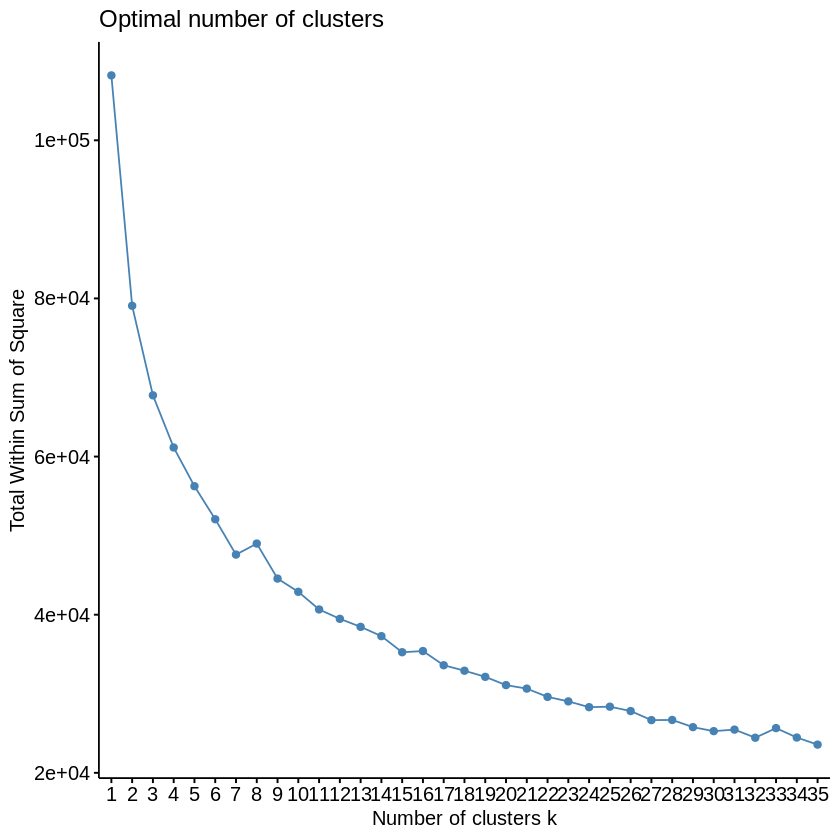

In [13]:
xnb3
pdf(file="elbow_nbcluster_vistaSNS101_vs_vista.pdf", height=4.5, width=6)
print(xnb3)
dev.off()

In [20]:
set.seed(50)
som.grid <- somgrid(xdim = grid-5, ydim = grid-5, topo = 'hexagonal', toroidal = T)
som.model_SNS101Vista <- som(data.matrix(vistaSNS101_vista.matrix), grid = som.grid, rlen=6500)
summary(som.model_SNS101Vista)


SOM of size 30x30 with a hexagonaltoroidal topology and a bubble neighbourhood function.
The number of data layers is 1.
Distance measure(s) used: sumofsquares.
Training data included: 6828 objects.
Mean distance to the closest unit in the map: 0.533.


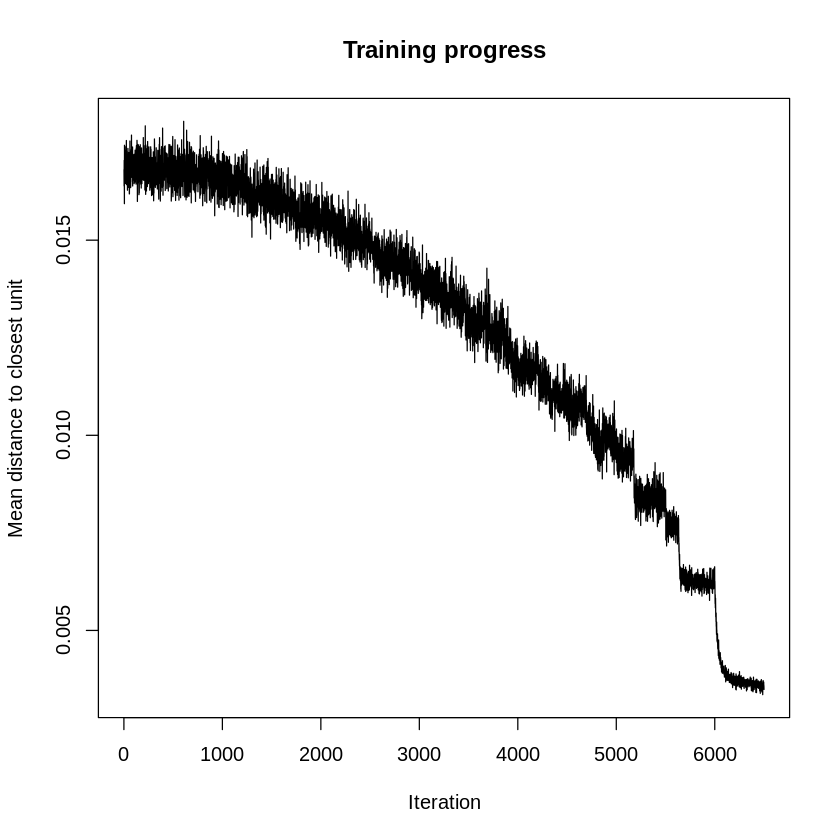

In [21]:

plot(som.model_SNS101Vista, type = "changes")

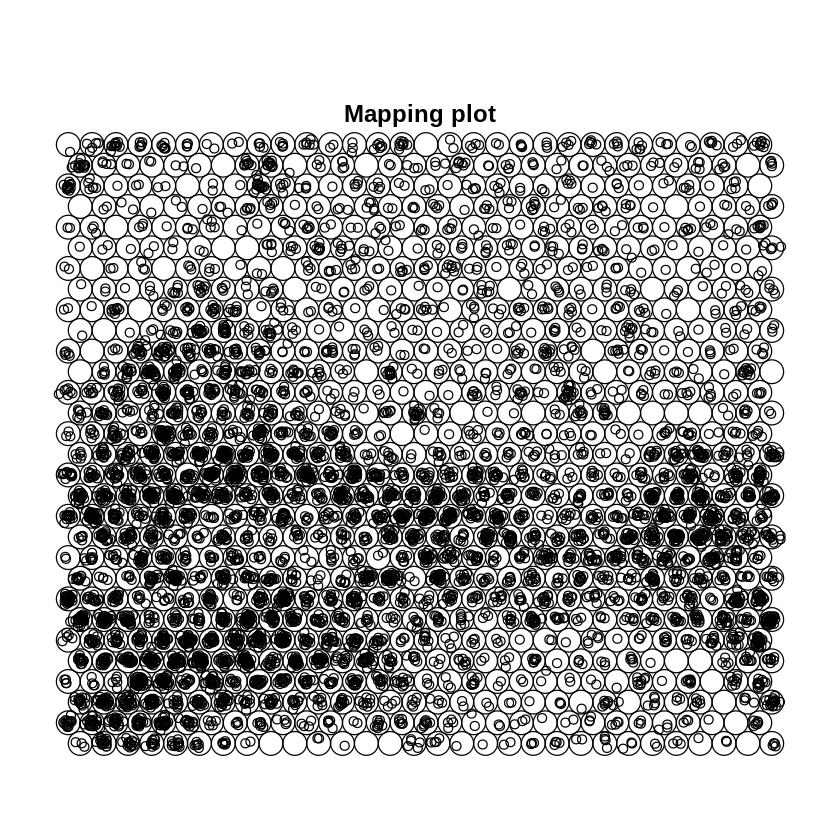

In [22]:
plot(som.model_SNS101Vista, type = "mapping")

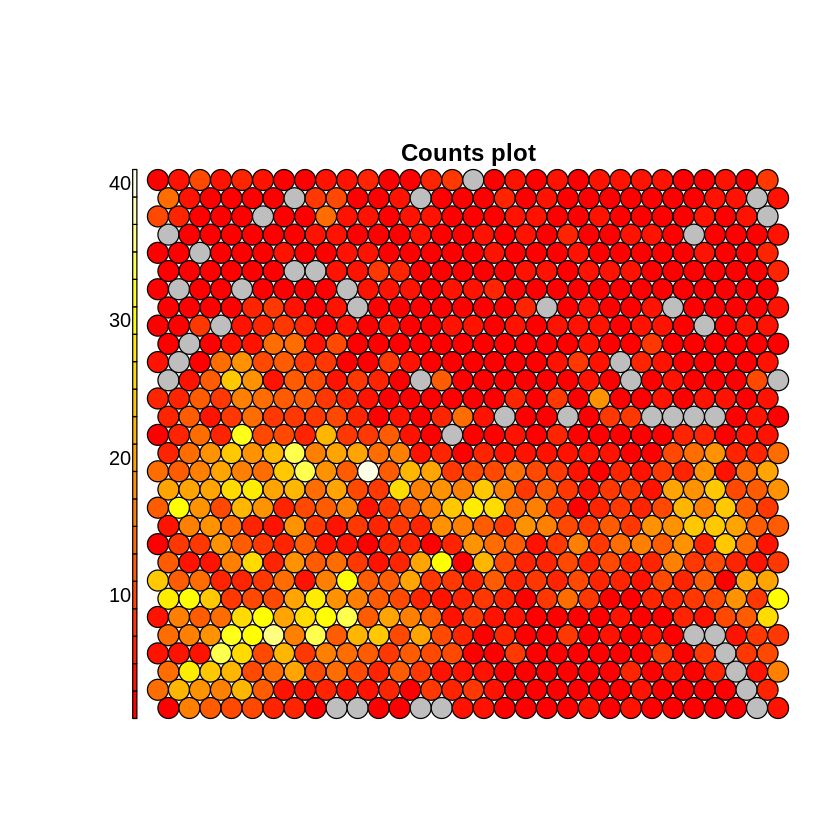

In [23]:
plot(som.model_SNS101Vista, type = "counts")

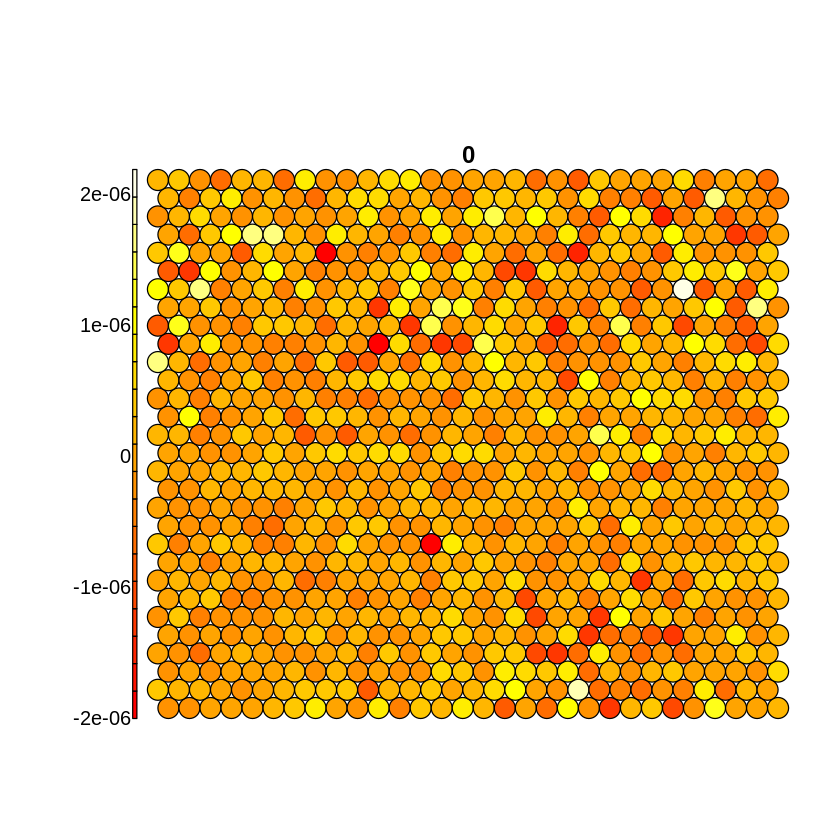

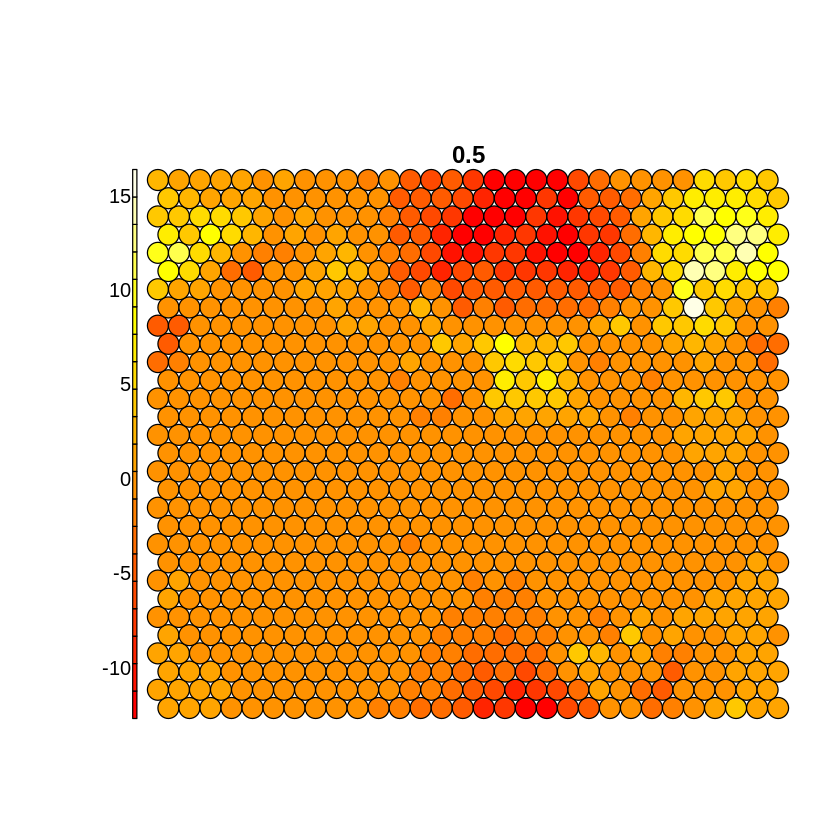

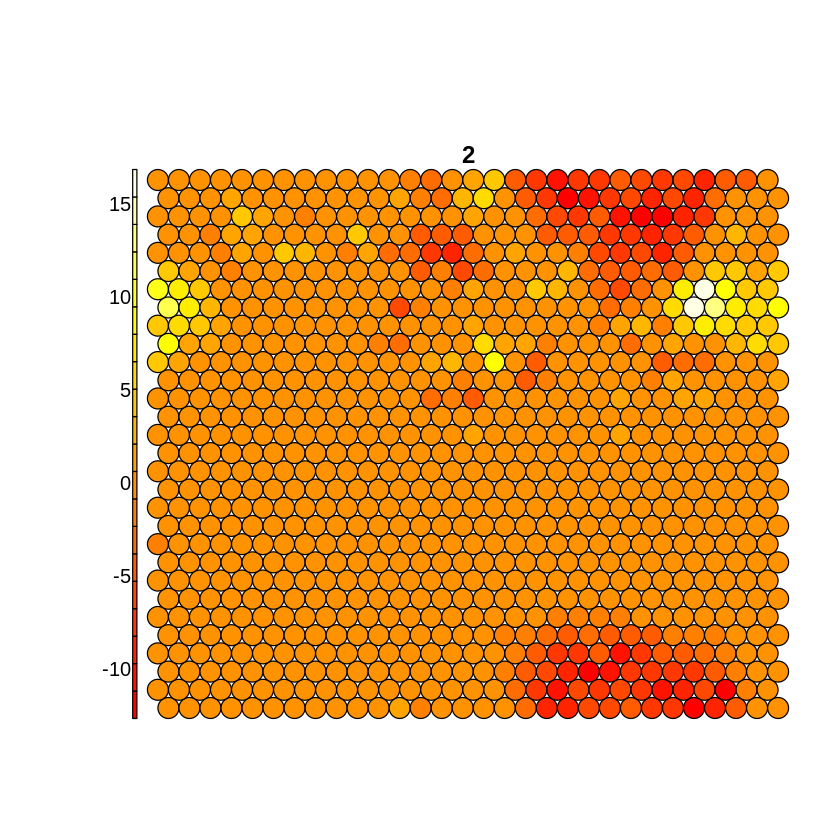

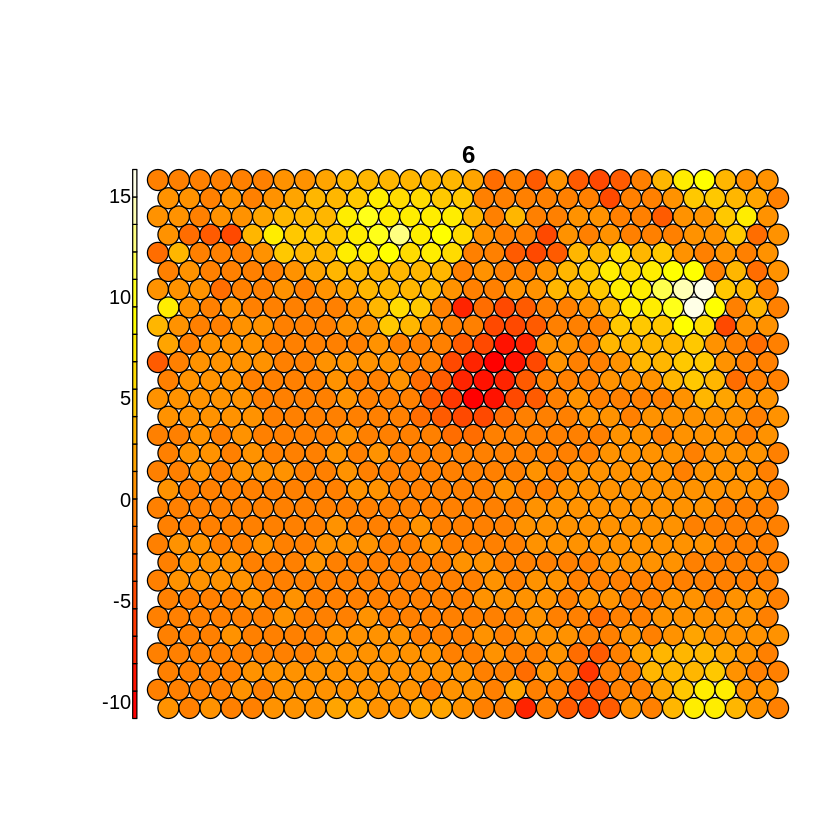

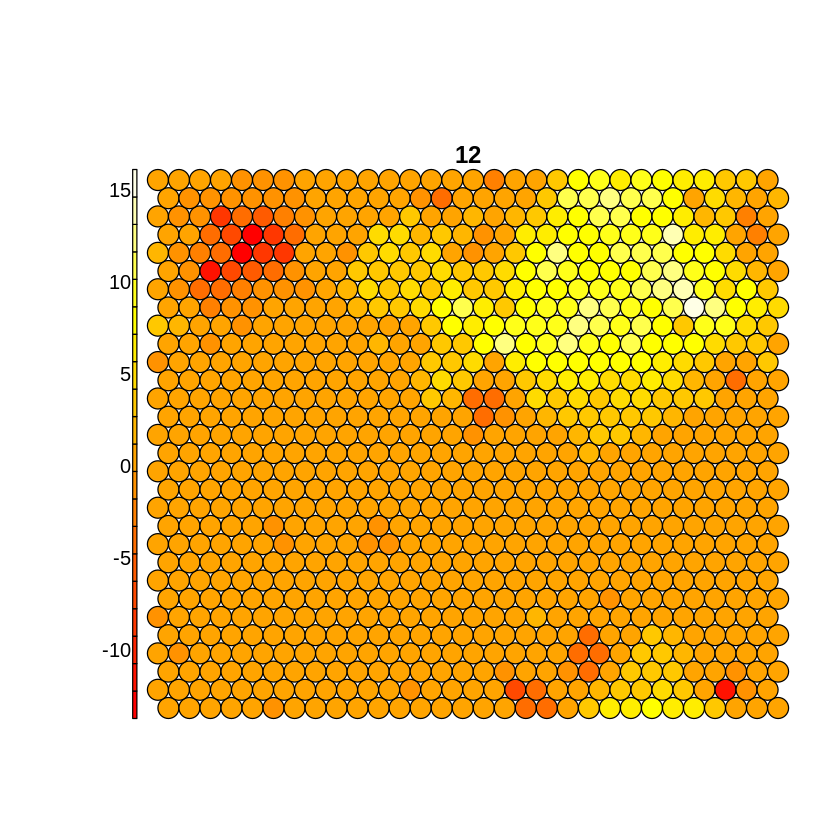

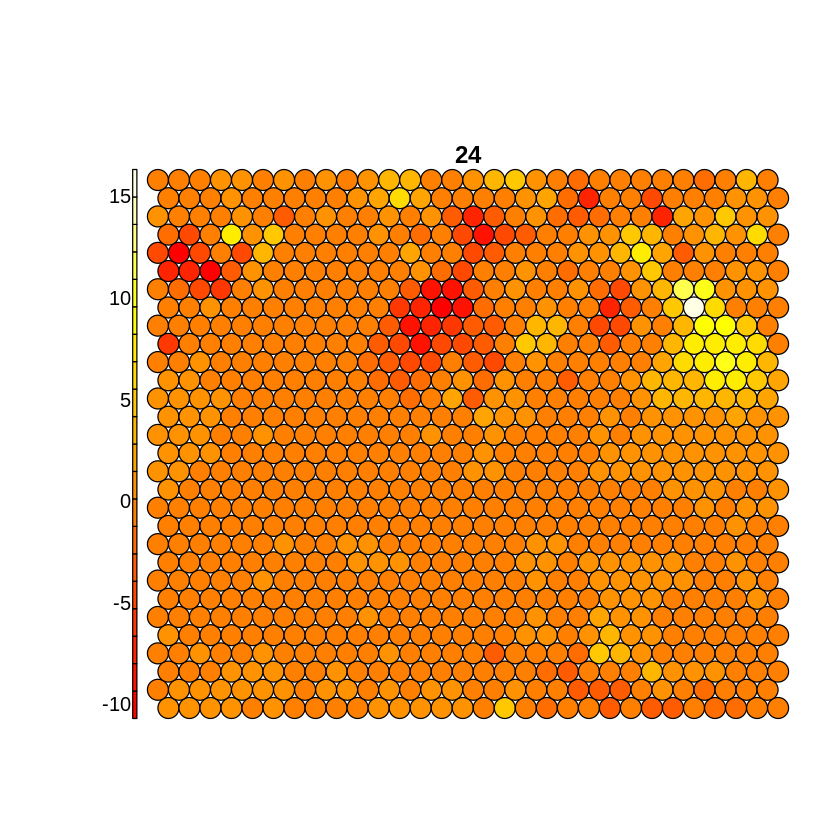

In [24]:
heatmap.som(som.model_SNS101Vista)

             Length Class  Mode   
cluster      900    -none- numeric
centers       42    -none- numeric
totss          1    -none- numeric
withinss       7    -none- numeric
tot.withinss   1    -none- numeric
betweenss      1    -none- numeric
size           7    -none- numeric
iter           1    -none- numeric
ifault         1    -none- numeric

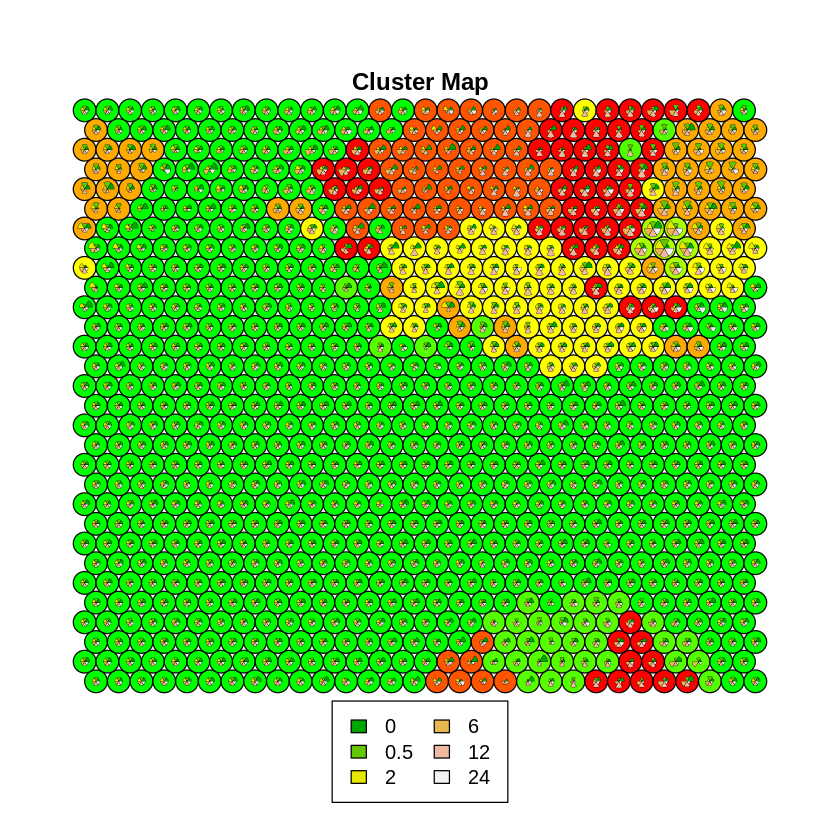

In [25]:
#clustering
set.seed(100)
clust <- kmeans(som.model_SNS101Vista$codes[[1]], 7)
summary(clust)
plot(som.model_SNS101Vista, type = "codes", bgcol = rainbow(18)[clust$cluster], main = "Cluster Map")
#add.cluster.boundaries(som.model, clust$cluster)

Done

In [26]:
sessionInfo()

R version 4.2.2 (2022-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 22.04.2 LTS

Matrix products: default
BLAS/LAPACK: /opt/conda/lib/libopenblasp-r0.3.21.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices datasets  utils     methods   base     

other attached packages:
 [1] forcats_0.5.2    stringr_1.5.0    purrr_1.0.1      tibble_3.1.8    
 [5] tidyverse_1.3.2  kohonen_3.0.12   factoextra_1.0.7 ggplot2_3.4.0   
 [9] FactoMineR_2.8   rstatix_0.7.2    openxlsx_4.2.5.2 pheatmap_1.0.12 
[13] readr_2.1.3      diann_1.0.1      tidyr_1.3.0      dplyr_1.0.10    
[17] here_1.0.1      

loaded via a n